In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import warnings
import itertools as it
import json
import requests
import seaborn as sns

import pickle as pkl
from functools import reduce

/home/ssm-user/anaconda3/envs/codec/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/home/ssm-user/anaconda3/envs/codec/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=80)
print(sc.__version__)
sc.settings.n_jobs=30

1.4.5.post1


In [3]:
prefix = '/data/codec/production.run/'

### Load in Data

In [4]:
path = prefix + 'mrna/pkls/aggr/wells.sng.w_covars.pkl'

# with open(path,'wb') as file:
#     pkl.dump(wells, file)
    
with open(path,'rb') as file:
    wells = pkl.load(file)

### Adjust Cell Barcodes, Filter

I'm adjusting the cell barcodes to make them match their well number, which I also did with the ADTs.

In [5]:
for well in wells:
    wells[well]['adata'].obs_names = [i[:16] + '-%s' % well for i in wells[well]['adata'].obs_names]

### Concatenate

In [6]:
concat = wells[0]['adata'].concatenate(*[wells[i]['adata'] for  i in range(1, 12)])

In [7]:
path = prefix + 'mrna/obs/label.mito/mito.csv'
concat.obs = concat.obs.join(pd.read_csv(path, index_col=0))

In [8]:
concat = concat[(concat.obs['cond'] == 'C') & (concat.obs['celltype'] == 'LOW_MITO')].copy()

In [9]:
concat.var['total_mrna_n_counts'] = concat.X.toarray().sum(axis=0)
concat.obs['mrna_n_counts'] = concat.X.toarray().sum(axis=1)

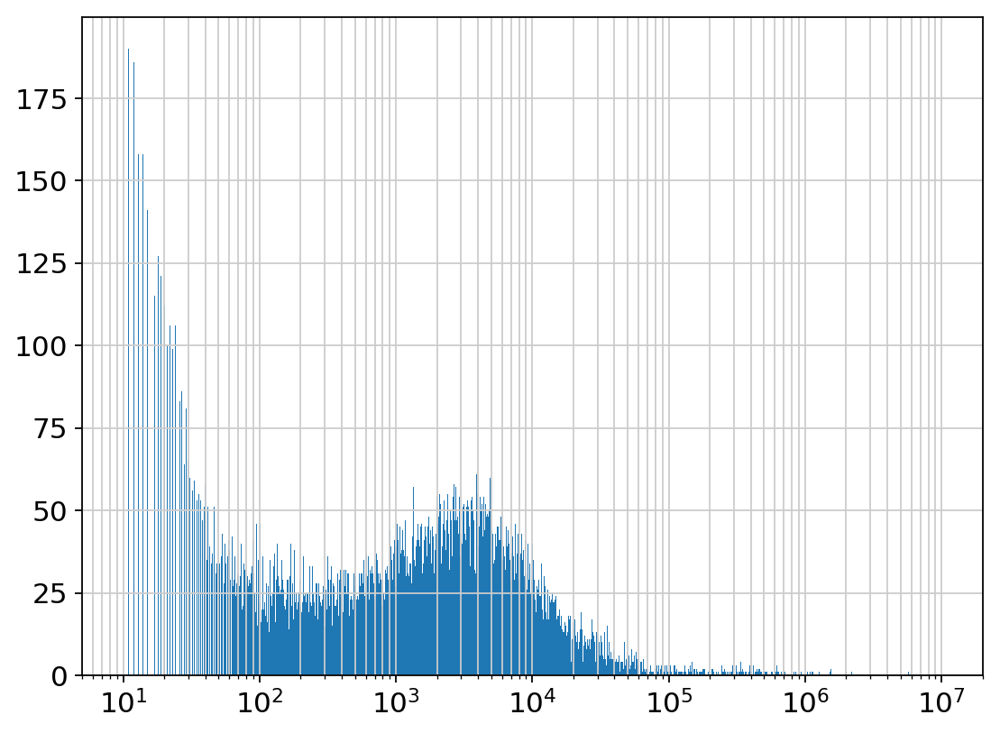

In [10]:
plt.figure(figsize=(8,6))
plt.hist(concat.var['total_mrna_n_counts'].values, bins=np.logspace(np.log10(10),np.log10(1e7), 1000))
plt.grid(False)
plt.grid(True, 'both', 'both')
plt.xscale('log')
# plt.yscale('log')

In [11]:
gene_subset_1, _ = sc.pp.filter_genes(concat, min_counts=500, inplace=False)

filtered out 9906 genes that are detected in less than 500 counts


In [12]:
gene_subset_2, _ = sc.pp.filter_genes(concat, max_counts=1e4, inplace=False)

filtered out 1851 genes that are detected in more than 10000.0 counts


In [13]:
concat = concat[:, np.fromiter(map(all, zip(gene_subset_1, gene_subset_2)), dtype=bool)].copy()

In [14]:
sc.pp.normalize_per_cell(concat, counts_per_cell_after=1e6)
sc.pp.log1p(concat)
sc.pp.scale(concat)
sc.pp.combat(concat, key='batch')
sc.pp.scale(concat)
sc.pp.pca(concat, n_comps=200)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
    ... scale_data: as `zero_center=True`, sparse input is densified and may lead to large memory consumption.


... storing 'DROPLET.TYPE' as categorical
... storing 'cond' as categorical
... storing 'exp_id' as categorical
... storing 'free_id' as categorical
... storing 'pool_code' as categorical
... storing 'celltype' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


Standardizing Data across genes.

Found 12 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data

computing PCA with n_comps = 200
    finished (0:00:50)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


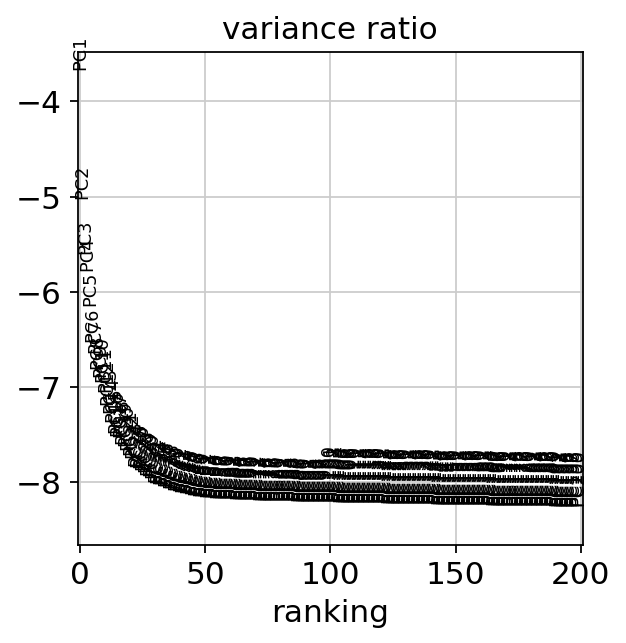

In [15]:
sc.pl.pca_variance_ratio(concat, log=True, n_pcs=200)

In [17]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(concat, n_neighbors=15, n_pcs=50)
warnings.filterwarnings('default')

computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:07)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:09)


In [18]:
sc.tl.umap(concat)

computing UMAP
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:26)


In [40]:
sc.tl.leiden(concat, resolution=0.5)
sc.tl.leiden(concat, resolution=0.3, restrict_to=('leiden',['0']))
sc.tl.leiden(concat, resolution=0.2, restrict_to=('leiden',['4']))

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:07)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


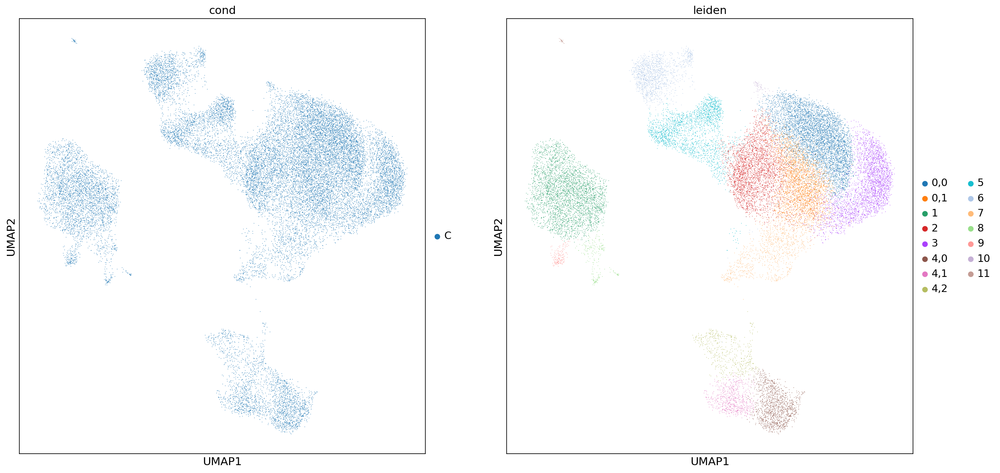

In [41]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for color, ax in zip(['cond', 'leiden'], ax):
    sc.pl.umap(concat,color=color, ax=ax, show=False, return_fig=False, size=2)

In [24]:
def add_raw(adata, transformed=True):
    path = prefix + 'mrna/pkls/aggr/wells.sng.w_covars.pkl'
    
    with open(path,'rb') as file:
        wells = pkl.load(file)
    
    for well in wells:
        wells[well]['adata'].obs_names = [i[:16] + '-%s' % well for i in wells[well]['adata'].obs_names]
    
    raw = wells[0]['adata'].concatenate(*[wells[i]['adata'] for  i in range(1, 12)])[adata.obs_names,:]
    
    if transformed == True:
        sc.pp.normalize_per_cell(raw,counts_per_cell_after=1e6)
        sc.pp.log1p(raw)
    
    adata.raw = raw
    return

In [25]:
add_raw(concat)

normalizing by total count per cell


Trying to set attribute `.obs` of view, copying.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


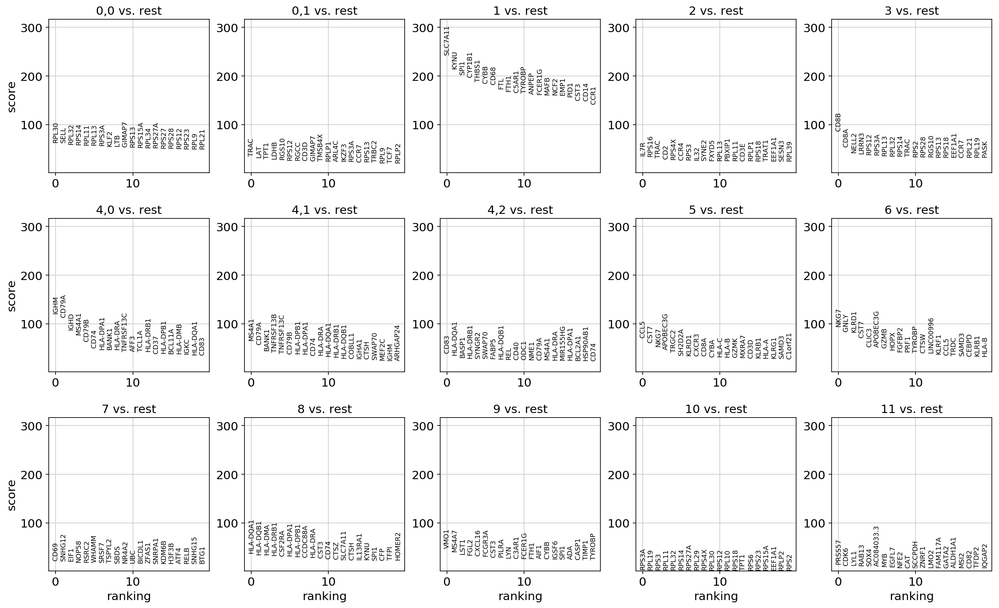

In [42]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(concat, groupby='leiden', n_genes=50)
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(concat, ncols=5, n_genes=20)
sc.settings.verbosity = 4

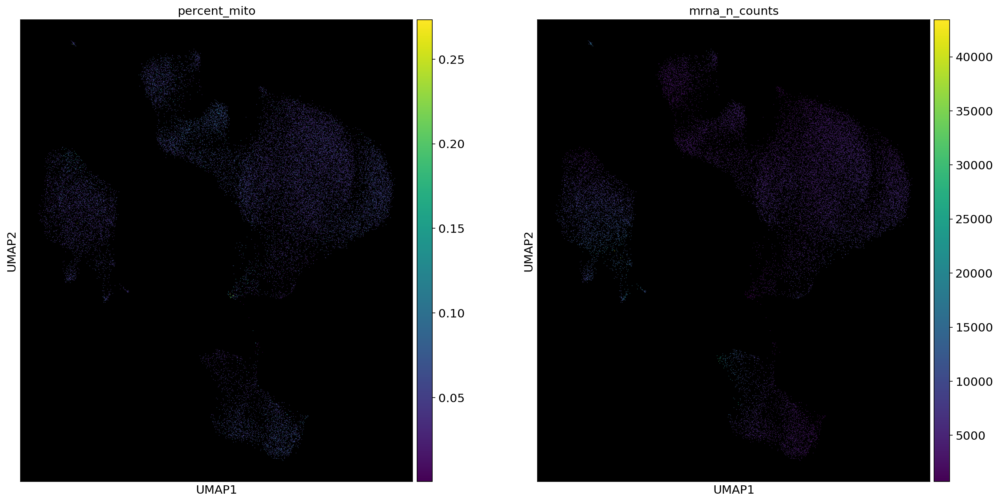

In [43]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for color, ax in zip(['percent_mito', 'mrna_n_counts'], ax):
    ax.set_facecolor('black')
    sc.pl.umap(concat,color=color, ax=ax, show=False, return_fig=False, size=2)

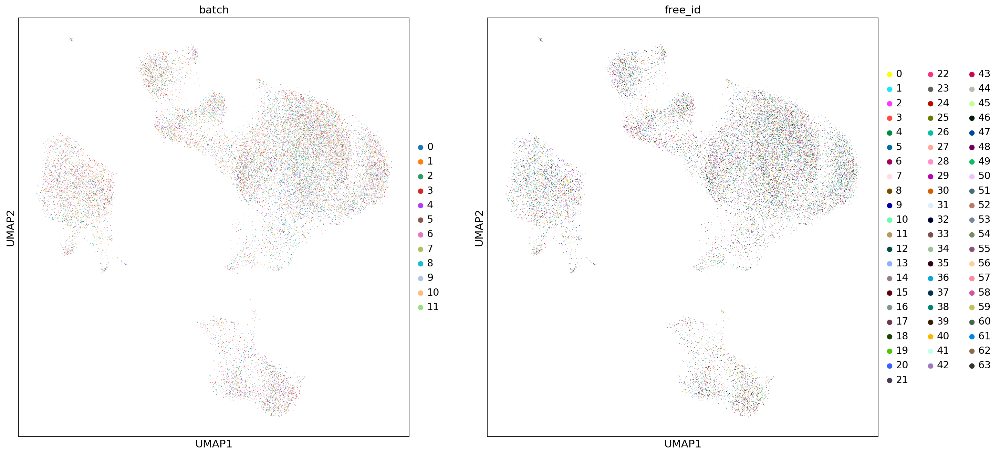

In [44]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for color, ax in zip(['batch', 'free_id'], ax):
    sc.pl.umap(concat,color=color, ax=ax, show=False, return_fig=False, size=2)

In [61]:
gene_list = np.unique([i for i in np.ravel(concat.uns['rank_genes_groups']['names'].tolist()) if not i.startswith('MT')])

In [76]:
concat = wells[0]['adata'].concatenate(*[wells[i]['adata'] for  i in range(1, 12)])

In [77]:
path = prefix + 'mrna/obs/label.mito/mito.csv'
concat.obs = concat.obs.join(pd.read_csv(path, index_col=0))

In [78]:
concat.var['total_mrna_n_counts'] = concat.X.toarray().sum(axis=0)
concat.obs['mrna_n_counts'] = concat.X.toarray().sum(axis=1)

In [79]:
concat = concat[:, gene_list].copy()
concat = concat[concat.obs['celltype'] != 'SOUP', :].copy()

In [80]:
sc.pp.normalize_per_cell(concat, counts_per_cell_after=1e6)
sc.pp.log1p(concat)
sc.pp.scale(concat)
sc.pp.combat(concat, key='batch',covariates=['cond','free_id'])
sc.pp.scale(concat)
sc.pp.combat(concat, key='celltype',covariates=['cond','free_id'])
sc.pp.scale(concat)
sc.pp.pca(concat, n_comps=200)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
    ... scale_data: as `zero_center=True`, sparse input is densified and may lead to large memory consumption.


... storing 'DROPLET.TYPE' as categorical
... storing 'cond' as categorical
... storing 'exp_id' as categorical
... storing 'free_id' as categorical
... storing 'pool_code' as categorical
... storing 'celltype' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


Standardizing Data across genes.

Found 12 batches

Found 2 categorical variables:
	cond, free_id

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data

Standardizing Data across genes.

Found 2 batches

Found 2 categorical variables:
	cond, free_id

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data

computing PCA with n_comps = 200
    finished (0:00:09)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


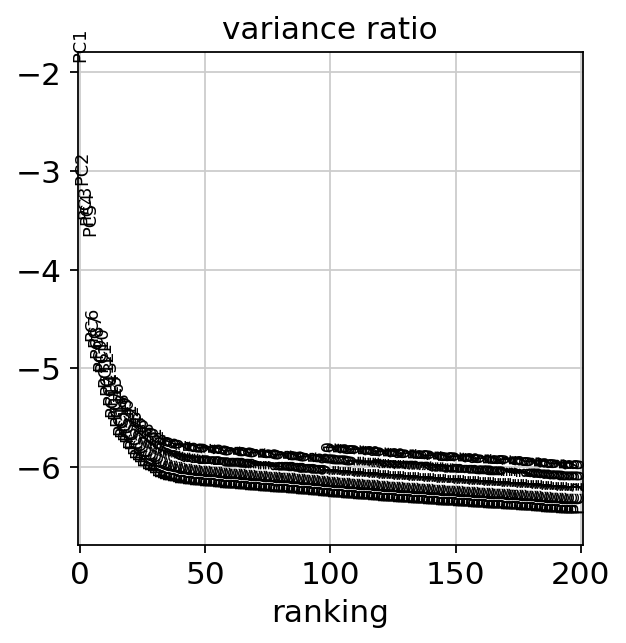

In [81]:
sc.pl.pca_variance_ratio(concat, log=True, n_pcs=200)

In [82]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(concat, n_neighbors=15, n_pcs=50)
warnings.filterwarnings('default')

computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:01:08)
    computed connectivities (0:00:04)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:01:13)


In [83]:
sc.tl.umap(concat)

computing UMAP
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:47)


In [84]:
sc.tl.leiden(concat, resolution=0.5)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:10)


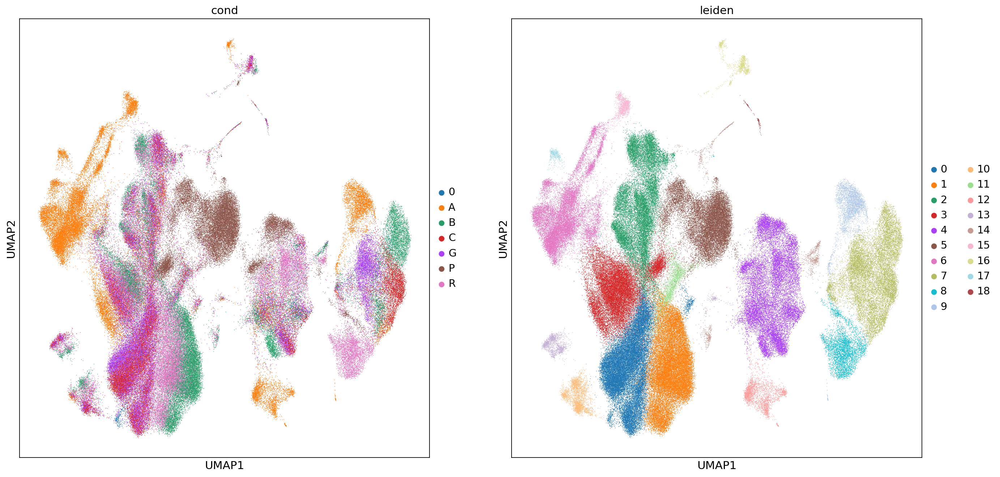

In [85]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for color, ax in zip(['cond', 'leiden'], ax):
    sc.pl.umap(concat,color=color, ax=ax, show=False, return_fig=False, size=2)

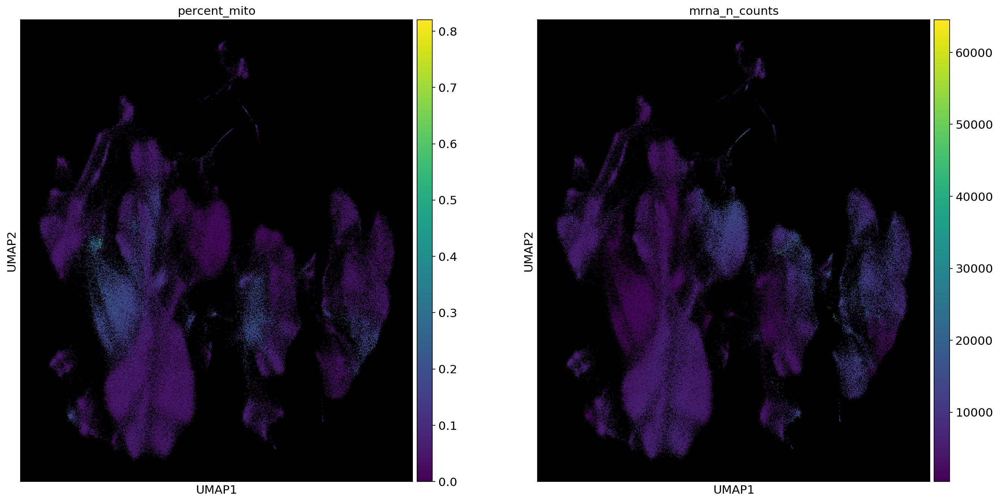

In [86]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for color, ax in zip(['percent_mito', 'mrna_n_counts'], ax):
    ax.set_facecolor('black')
    sc.pl.umap(concat,color=color, ax=ax, show=False, return_fig=False, size=2)

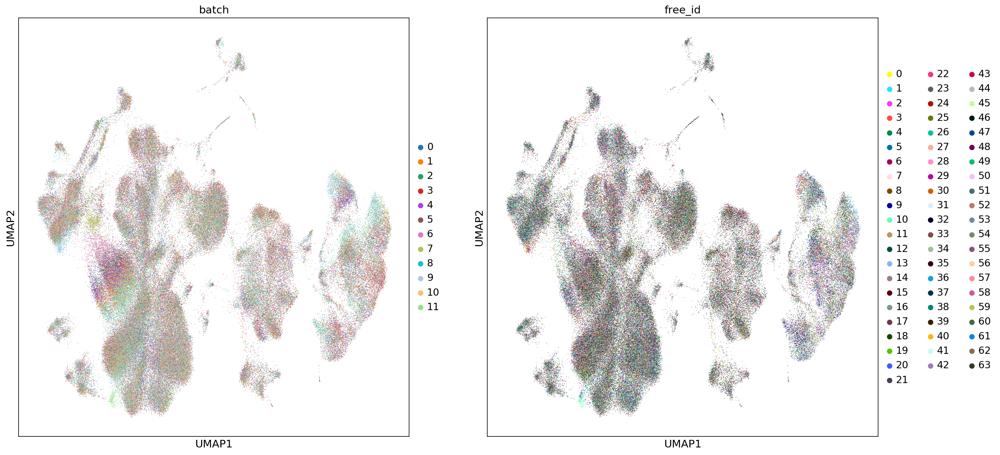

In [87]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for color, ax in zip(['batch', 'free_id'], ax):
    sc.pl.umap(concat,color=color, ax=ax, show=False, return_fig=False, size=2)